In [66]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy as sp
import seaborn as sns
import re
import os
import time

In [67]:
df =pd.read_csv("/Users/nithish02/Documents/fifa19/data.csv")
df

,Unnamed: 0,ID,Name,Age,Photo,Nationality,Flag,Overall,Potential,Club,...,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Release Clause
0,0,158023,L. Messi,31,https://cdn.sofifa.org/players/4/19/158023.png,Argentina,https://cdn.sofifa.org/flags/52.png,94,94,FC Barcelona,...,96.0,33.0,28.0,26.0,6.0,11.0,15.0,14.0,8.0,€226.5M
1,1,20801,Cristiano Ronaldo,33,https://cdn.sofifa.org/players/4/19/20801.png,Portugal,https://cdn.sofifa.org/flags/38.png,94,94,Juventus,...,95.0,28.0,31.0,23.0,7.0,11.0,15.0,14.0,11.0,€127.1M
2,2,190871,Neymar Jr,26,https://cdn.sofifa.org/players/4/19/190871.png,Brazil,https://cdn.sofifa.org/flags/54.png,92,93,Paris Saint-Germain,...,94.0,27.0,24.0,33.0,9.0,9.0,15.0,15.0,11.0,€228.1M
3,3,193080,De Gea,27,https://cdn.sofifa.org/players/4/19/193080.png,Spain,https://cdn.sofifa.org/flags/45.png,91,93,Manchester United,...,68.0,15.0,21.0,13.0,90.0,85.0,87.0,88.0,94.0,€138.6M
4,4,192985,K. De Bruyne,27,https://cdn.sofifa.org/players/4/19/192985.png,Belgium,https://cdn.sofifa.org/flags/7.png,91,92,Manchester City,...,88.0,68.0,58.0,51.0,15.0,13.0,5.0,10.0,13.0,€196.4M
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18202,18202,238813,J. Lundstram,19,https://cdn.sofifa.org/players/4/19/238813.png,England,https://cdn.sofifa.org/flags/14.png,47,65,Crewe Alexandra,...,45.0,40.0,48.0,47.0,10.0,13.0,7.0,8.0,9.0,€143K
18203,18203,243165,N. Christoffersson,19,https://cdn.sofifa.org/players/4/19/243165.png,Sweden,https://cdn.sofifa.org/flags/46.png,47,63,Trelleborgs FF,...,42.0,22.0,15.0,19.0,10.0,9.0,9.0,5.0,12.0,€113K
18204,18204,241638,B. Worman,16,https://cdn.sofifa.org/players/4/19/241638.png,England,https://cdn.sofifa.org/flags/14.png,47,67,Cambridge United,...,41.0,32.0,13.0,11.0,6.0,5.0,10.0,6.0,13.0,€165K
18205,18205,246268,D. Walker-Rice,17,https://cdn.sofifa.org/players/4/19/246268.png,England,https://cdn.sofifa.org/flags/14.png,47,66,Tranmere Rovers,...,46.0,20.0,25.0,27.0,14.0,6.0,14.0,8.0,9.0,€143K


In [68]:
df.columns =[b.replace(' ', '')for b in df.columns]
df.columns

Index(['Unnamed:0', 'ID', 'Name', 'Age', 'Photo', 'Nationality', 'Flag',
       'Overall', 'Potential', 'Club', 'ClubLogo', 'Value', 'Wage', 'Special',
       'PreferredFoot', 'InternationalReputation', 'WeakFoot', 'SkillMoves',
       'WorkRate', 'BodyType', 'RealFace', 'Position', 'JerseyNumber',
       'Joined', 'LoanedFrom', 'ContractValidUntil', 'Height', 'Weight', 'LS',
       'ST', 'RS', 'LW', 'LF', 'CF', 'RF', 'RW', 'LAM', 'CAM', 'RAM', 'LM',
       'LCM', 'CM', 'RCM', 'RM', 'LWB', 'LDM', 'CDM', 'RDM', 'RWB', 'LB',
       'LCB', 'CB', 'RCB', 'RB', 'Crossing', 'Finishing', 'HeadingAccuracy',
       'ShortPassing', 'Volleys', 'Dribbling', 'Curve', 'FKAccuracy',
       'LongPassing', 'BallControl', 'Acceleration', 'SprintSpeed', 'Agility',
       'Reactions', 'Balance', 'ShotPower', 'Jumping', 'Stamina', 'Strength',
       'LongShots', 'Aggression', 'Interceptions', 'Positioning', 'Vision',
       'Penalties', 'Composure', 'Marking', 'StandingTackle', 'SlidingTackle',
       'GKDi

In [69]:
df.drop('Unnamed:0', axis=1, inplace=True)
df.head()

,ID,Name,Age,Photo,Nationality,Flag,Overall,Potential,Club,ClubLogo,...,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,ReleaseClause
0,158023,L. Messi,31,https://cdn.sofifa.org/players/4/19/158023.png,Argentina,https://cdn.sofifa.org/flags/52.png,94,94,FC Barcelona,https://cdn.sofifa.org/teams/2/light/241.png,...,96.0,33.0,28.0,26.0,6.0,11.0,15.0,14.0,8.0,€226.5M
1,20801,Cristiano Ronaldo,33,https://cdn.sofifa.org/players/4/19/20801.png,Portugal,https://cdn.sofifa.org/flags/38.png,94,94,Juventus,https://cdn.sofifa.org/teams/2/light/45.png,...,95.0,28.0,31.0,23.0,7.0,11.0,15.0,14.0,11.0,€127.1M
2,190871,Neymar Jr,26,https://cdn.sofifa.org/players/4/19/190871.png,Brazil,https://cdn.sofifa.org/flags/54.png,92,93,Paris Saint-Germain,https://cdn.sofifa.org/teams/2/light/73.png,...,94.0,27.0,24.0,33.0,9.0,9.0,15.0,15.0,11.0,€228.1M
3,193080,De Gea,27,https://cdn.sofifa.org/players/4/19/193080.png,Spain,https://cdn.sofifa.org/flags/45.png,91,93,Manchester United,https://cdn.sofifa.org/teams/2/light/11.png,...,68.0,15.0,21.0,13.0,90.0,85.0,87.0,88.0,94.0,€138.6M
4,192985,K. De Bruyne,27,https://cdn.sofifa.org/players/4/19/192985.png,Belgium,https://cdn.sofifa.org/flags/7.png,91,92,Manchester City,https://cdn.sofifa.org/teams/2/light/10.png,...,88.0,68.0,58.0,51.0,15.0,13.0,5.0,10.0,13.0,€196.4M


In [70]:
df["Wage"].head()

0    €565K
1    €405K
2    €290K
3    €260K
4    €355K
Name: Wage, dtype: object

In [71]:
df.Wage = df.Wage.str.replace("€", "")
df.Wage = df.Wage.str.replace("K", "").astype("float")
df.Wage.head()

0    565.0
1    405.0
2    290.0
3    260.0
4    355.0
Name: Wage, dtype: float64

In [72]:
df.ID.unique().shape

(18207,)

PREFERRED FOOT 


In [73]:
preferred_foot = df["PreferredFoot"].value_counts()
preferred_foot = preferred_foot.reset_index()
preferred_foot.columns = ["PreferredFoot", "Count"]
preferred_foot

,PreferredFoot,Count
0,Right,13948
1,Left,4211


Text(0.5, 1.0, 'Figure 1 :\n\n Preferred Foot Count Plot')

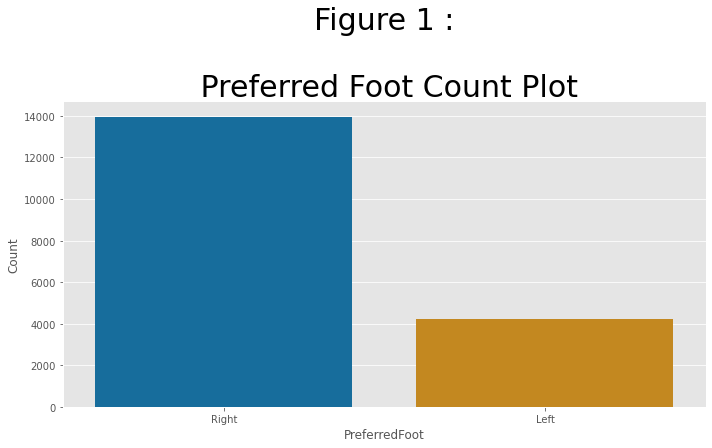

In [74]:
pt = sns.catplot(x = "PreferredFoot", y = "Count", data = preferred_foot, 
        palette="colorblind", height=5, aspect= 2, kind = "bar");
plt.style.use("ggplot")
plt.title("Figure 1 :\n\n Preferred Foot Count Plot", fontsize=30)

Text(0.5, 1.0, 'Figure 2 :\n\nOverall Ranking vs Preferred  Foot')

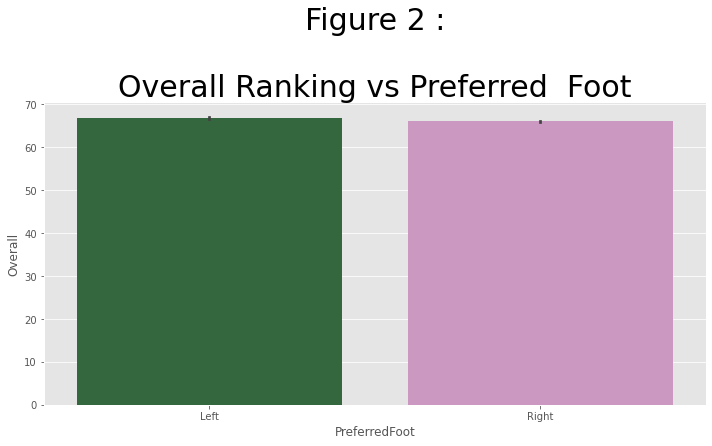

In [75]:
sns.catplot(x = 'PreferredFoot', y = 'Overall', palette='cubehelix', data=df, aspect= 2, kind = 'bar')
plt.style.use('ggplot')
plt.title("Figure 2 :\n\nOverall Ranking vs Preferred  Foot", fontsize=30)


Text(0.5, 1.0, 'Figure 3: \n\n Wages vs Preferred Foot')

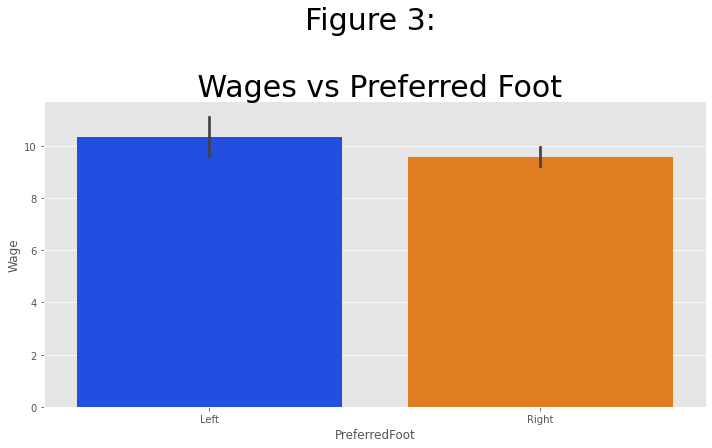

In [76]:
sns.catplot(x='PreferredFoot', y= 'Wage', palette='bright',data= df, aspect=2, kind='bar')
plt.style.use('ggplot')
plt.title("Figure 3: \n\n Wages vs Preferred Foot", fontsize=30)



In [77]:
counts_nationality = df["Nationality"].value_counts()
counts_nationality = counts_nationality.reset_index()
counts_nationality.columns = ["Nations", "Counts"]
print(counts_nationality)


                  Nations  Counts
0                 England    1662
1                 Germany    1198
2                   Spain    1072
3               Argentina     937
4                  France     914
..                    ...     ...
159         New Caledonia       1
160                  Fiji       1
161   São Tomé & Príncipe       1
162  United Arab Emirates       1
163              Botswana       1

[164 rows x 2 columns]


In [78]:
counts_nationality_top20 = counts_nationality[:20]
print(counts_nationality_top20)


                Nations  Counts
0               England    1662
1               Germany    1198
2                 Spain    1072
3             Argentina     937
4                France     914
5                Brazil     827
6                 Italy     702
7              Colombia     618
8                 Japan     478
9           Netherlands     453
10               Sweden     397
11             China PR     392
12                Chile     391
13  Republic of Ireland     368
14               Mexico     366
15        United States     353
16               Poland     350
17               Norway     341
18         Saudi Arabia     340
19              Denmark     336


Text(0.5, 1.0, 'Figure 4: \n\n Nations wise players counts for top 20')

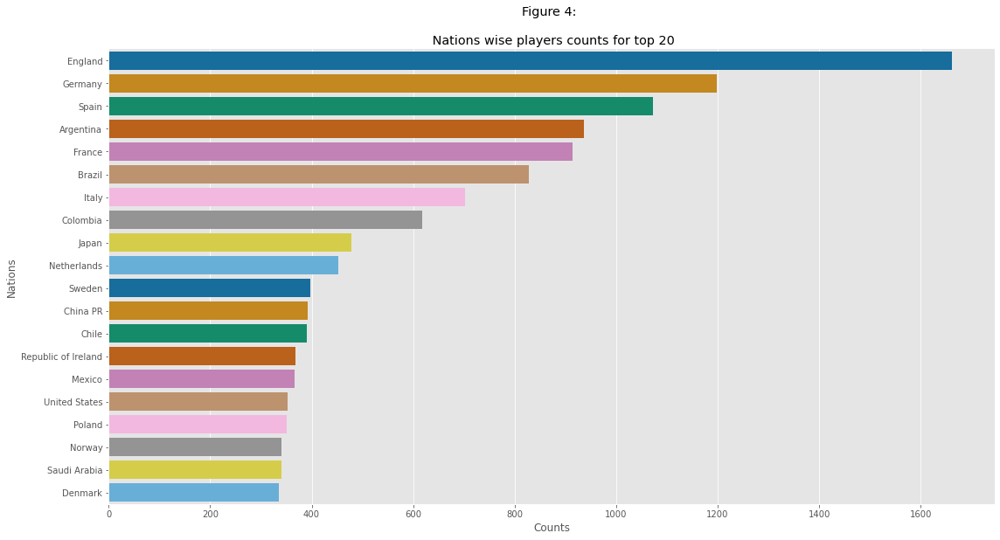

In [79]:
sns.catplot(x= 'Counts', y= 'Nations', palette='colorblind', data=counts_nationality_top20, kind='bar',aspect=2, height=8)
plt.style.use("ggplot")
plt.title("Figure 4: \n\n Nations wise players counts for top 20")


In [80]:
avgwageoverall = df.groupby("Nationality", as_index=False)['Wage', 'Overall'].mean()
avgwageoverall.sort_values(by="Wage", inplace=True, ascending=False)
avgwageoverall.head()

/var/folders/n7/mq8n_83j2wg08mtw7wxzjcyw0000gn/T/ipykernel_1365/2035540896.py:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  avgwageoverall = df.groupby("Nationality", as_index=False)['Wage', 'Overall'].mean()


,Nationality,Wage,Overall
42,Dominican Republic,71.000000,72.000000
156,United Arab Emirates,39.000000,77.000000
56,Gabon,26.933333,69.466667
7,Armenia,22.000000,69.000000
35,Croatia,21.682540,69.563492


In [81]:
top10bywage = avgwageoverall.iloc[:10]
top10bywage

,Nationality,Wage,Overall
42,Dominican Republic,71.000000,72.000000
156,United Arab Emirates,39.000000,77.000000
56,Gabon,26.933333,69.466667
7,Armenia,22.000000,69.000000
35,Croatia,21.682540,69.563492
27,Central African Rep.,19.000000,73.333333
13,Belgium,18.480769,68.811538
2,Algeria,18.083333,70.633333
20,Brazil,17.778718,71.251511
47,Equatorial Guinea,17.200000,70.000000


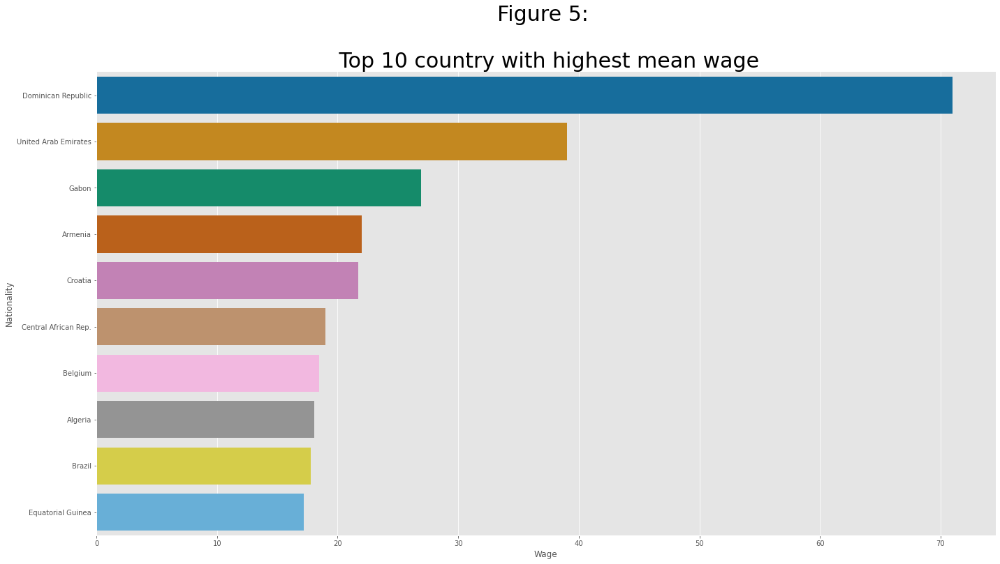

In [82]:
sns.catplot(x='Wage', y='Nationality', palette="colorblind", kind='bar',aspect=2, height=10, data=top10bywage)
plt.style.use('ggplot')
plt.title("Figure 5: \n\n Top 10 country with highest mean wage", fontsize =30);


In [83]:
avgwageoverall.sort_values(by= 'Overall', inplace=True, ascending=False)
top10byoverall = avgwageoverall.iloc[:10]
top10byoverall

,Nationality,Wage,Overall
156,United Arab Emirates,39.000000,77.000000
27,Central African Rep.,19.000000,73.333333
77,Israel,15.857143,72.142857
42,Dominican Republic,71.000000,72.000000
147,São Tomé & Príncipe,15.000000,72.000000
116,Oman,12.000000,72.000000
26,Cape Verde,11.526316,71.631579
123,Portugal,14.310559,71.344720
150,Togo,16.000000,71.333333
20,Brazil,17.778718,71.251511


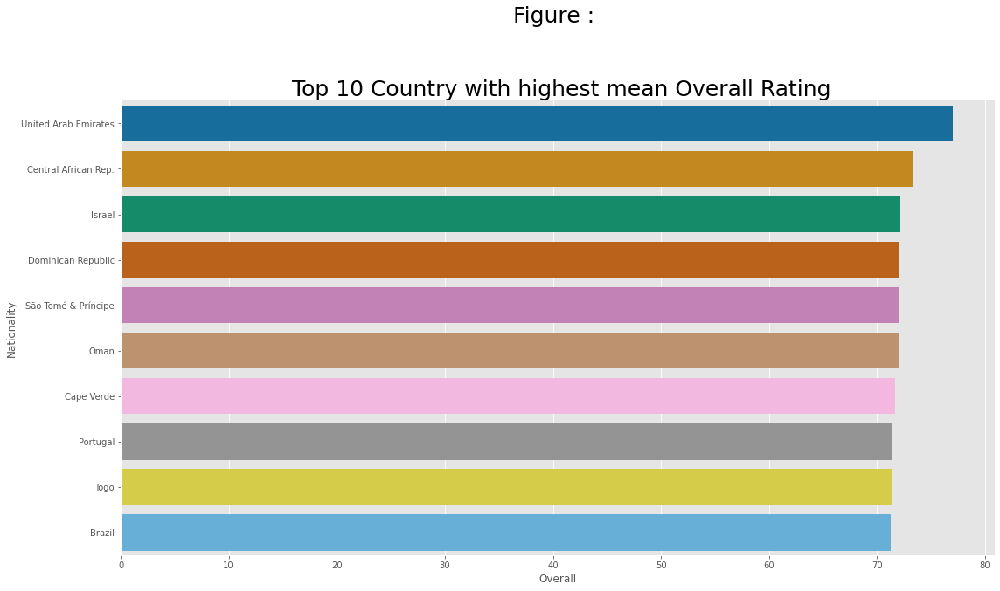

In [84]:
sns.catplot(x='Overall', y='Nationality', palette='colorblind', kind='bar', aspect=2, data=top10byoverall, height=8)
plt.title("Figure : \n\n\n Top 10 Country with highest mean Overall Rating",
          fontsize=25);

In [85]:
df.Club.unique().shape
df.Club.value_counts().shape
df.Club.isnull().any()

True

In [86]:
avgwageoverall = df.groupby("Club", as_index=False)["Wage","Overall"].mean()
avgwageoverall.sort_values(by="Wage",inplace=True, ascending= False)
avgwageoverall.head()

/var/folders/n7/mq8n_83j2wg08mtw7wxzjcyw0000gn/T/ipykernel_1365/1211153483.py:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  avgwageoverall = df.groupby("Club", as_index=False)["Wage","Overall"].mean()


,Club,Wage,Overall
470,Real Madrid,152.030303,78.242424
212,FC Barcelona,146.575758,78.030303
326,Juventus,131.680000,82.280000
374,Manchester City,113.363636,76.727273
375,Manchester United,102.757576,77.242424


In [87]:
top10bywage = avgwageoverall.iloc[:10]
top10bywage

,Club,Wage,Overall
470,Real Madrid,152.030303,78.242424
212,FC Barcelona,146.575758,78.030303
326,Juventus,131.680000,82.280000
374,Manchester City,113.363636,76.727273
375,Manchester United,102.757576,77.242424
134,Chelsea,98.454545,76.787879
363,Liverpool,87.939394,76.000000
583,Tottenham Hotspur,79.484848,76.696970
214,FC Bayern München,78.827586,77.000000
52,Arsenal,78.424242,75.181818


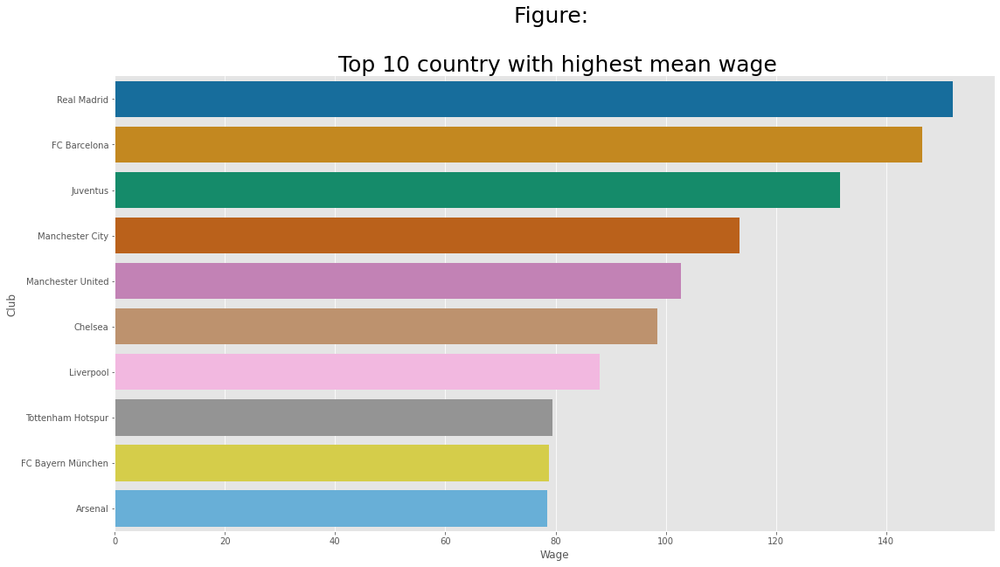

In [88]:
sns.catplot(y= 'Club', x= 'Wage', palette='colorblind', data=top10bywage, height=8, aspect=2, kind='bar')
plt.title("Figure: \n\n Top 10 country with highest mean wage", fontsize=25);


In [89]:
avgwageoverall.sort_values(by="Overall",inplace=True,ascending=False)
top10byoverall = avgwageoverall.iloc[0:10]
top10byoverall

,Club,Wage,Overall
326,Juventus,131.680000,82.280000
398,Napoli,71.080000,80.000000
315,Inter,66.500000,79.750000
470,Real Madrid,152.030303,78.242424
382,Milan,72.481481,78.074074
212,FC Barcelona,146.575758,78.030303
435,Paris Saint-Germain,72.033333,77.433333
482,Roma,53.807692,77.423077
375,Manchester United,102.757576,77.242424
214,FC Bayern München,78.827586,77.000000


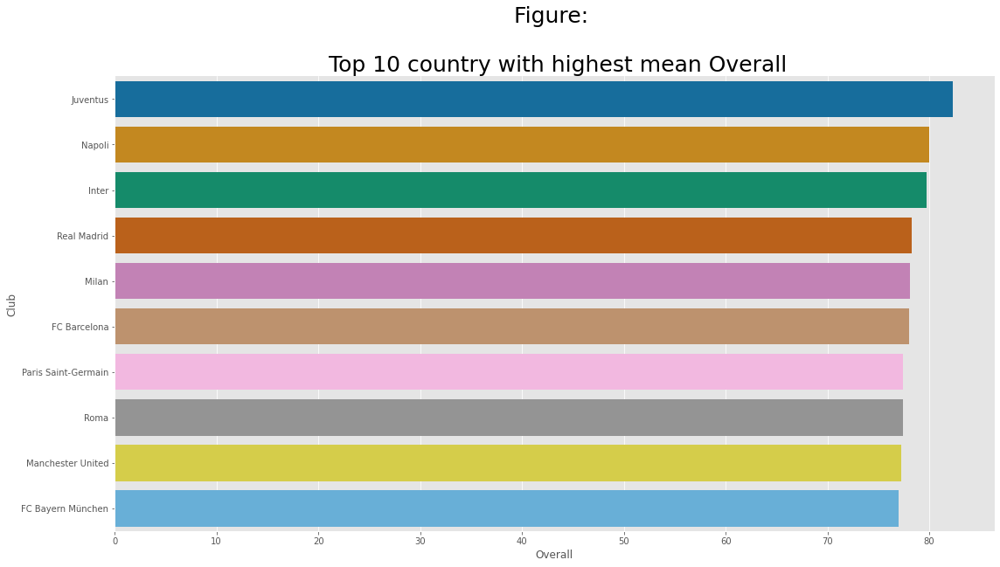

In [90]:
sns.catplot(y= 'Club', x= 'Overall', palette='colorblind', data=top10byoverall, height=8, aspect=2, kind='bar')
plt.title("Figure: \n\n Top 10 country with highest mean Overall", fontsize=25);


Findings Clubs and Overall Rating and Wage:

There are 651 clubs//
Club column has missing value too//
Club is having very distinct affect on wage//
Club is not having very sharp impact on overall rating//

In [91]:
df.Age.value_counts()


21    1423
26    1387
24    1358
22    1340
23    1332
25    1319
20    1240
27    1162
28    1101
19    1024
29     959
30     917
18     732
31     707
32     574
33     408
34     404
17     289
35     196
36     127
37      82
16      42
38      37
39      25
40      13
41       5
44       2
45       1
42       1
Name: Age, dtype: int64

In [92]:
df.Age.isnull().any()

False

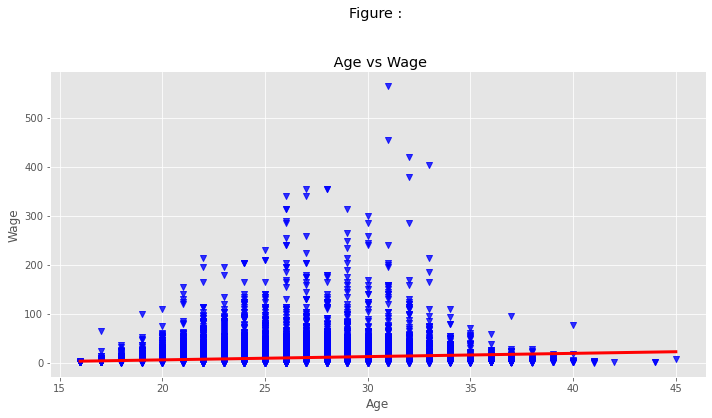

In [93]:
sns.lmplot(x="Age", y="Wage",data=df,markers="v",
            scatter_kws={"color": "blue"},
         line_kws={"linewidth":3,"color":"red"},aspect=2);
plt.title("Figure : \n\n\n Age vs Wage");

Text(0.5, 1.0, 'Figure: \n\n Overall Rating vs Wage')

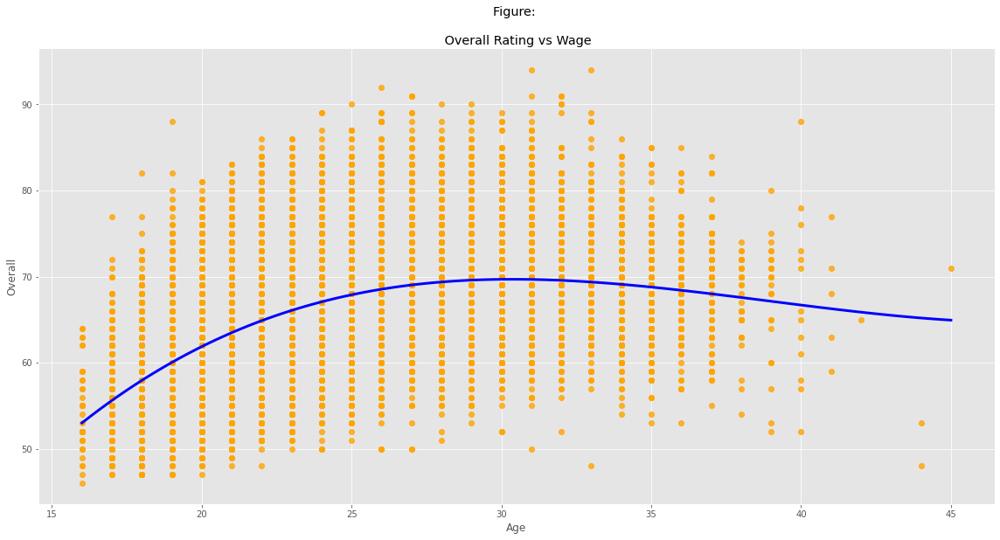

In [94]:
sns.lmplot(y="Overall", x="Age", markers="o", data=df, 
        order=3, ci= None, aspect=2, height=8, 
        scatter_kws={"color":"orange"}, line_kws={"linewidth":3, "color":"blue"})
plt.title("Figure: \n\n Overall Rating vs Wage")

In [95]:
df.BodyType.value_counts()

Normal                 10595
Lean                    6417
Stocky                  1140
Messi                      1
C. Ronaldo                 1
Neymar                     1
Courtois                   1
PLAYER_BODY_TYPE_25        1
Shaqiri                    1
Akinfenwa                  1
Name: BodyType, dtype: int64

In [96]:
df.BodyType.unique()

array(['Messi', 'C. Ronaldo', 'Neymar', 'Lean', 'Normal', 'Courtois',
       'Stocky', 'PLAYER_BODY_TYPE_25', 'Shaqiri', 'Akinfenwa', nan],
      dtype=object)

In [97]:
df.BodyType.isnull().any()

True

In [98]:
avgwageoverall = df.groupby("BodyType", as_index=False)["Wage", "Overall"].mean()
avgwageoverall.sort_values(by= "Wage",inplace=True, ascending=False)
avgwageoverall.head()


/var/folders/n7/mq8n_83j2wg08mtw7wxzjcyw0000gn/T/ipykernel_1365/3509158652.py:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  avgwageoverall = df.groupby("BodyType", as_index=False)["Wage", "Overall"].mean()


,BodyType,Wage,Overall
4,Messi,565.0,94.0
1,C. Ronaldo,405.0,94.0
5,Neymar,290.0,92.0
7,PLAYER_BODY_TYPE_25,255.0,88.0
2,Courtois,240.0,89.0


In [99]:
df.Penalties.value_counts()



45.0    492
55.0    488
49.0    480
48.0    473
58.0    471
       ... 
89.0      3
91.0      1
7.0       1
5.0       1
92.0      1
Name: Penalties, Length: 87, dtype: int64

In [100]:
df.Penalties.head()

0    75.0
1    85.0
2    81.0
3    40.0
4    79.0
Name: Penalties, dtype: float64

In [101]:
df.Penalties.unique()

array([75., 85., 81., 40., 79., 86., 82., 11., 88., 73., 50., 54., 90.,
       25., 27., 60., 47., 83., 70., 61., 66., 76., 67., 68., 59., 23.,
       22., 33., 78., 69., 71., 17., 62., 72., 43., 64., 77., 89., 58.,
       41., 56., 44., 55., 80., 84., 26., 45., 18., 46., 63., 49., 65.,
       57., 38., 32., 74., 91., 31., 16., 21., 20., 15., 24., 37., 53.,
       52., 39., 92., 13., 14., 48., 34., 36., 51., 19., 30., 42., 29.,
       10.,  9., 87., 35., 12., 28., nan,  7.,  5.,  8.])

In [102]:
df.Penalties.isnull().any()

True

In [103]:
df.Penalties.isnull().sum()

48

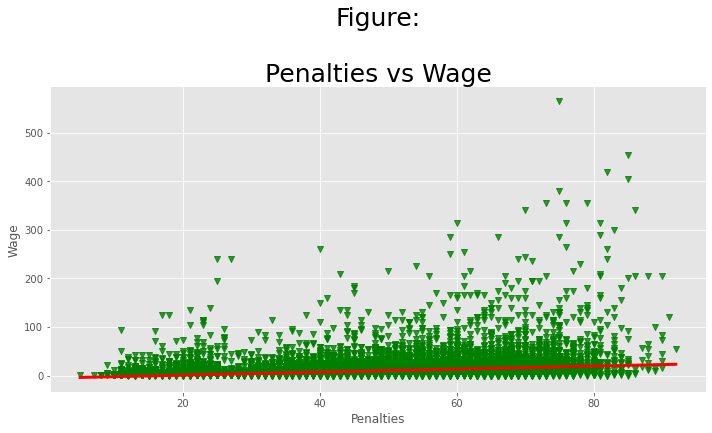

In [104]:
sns.lmplot(x="Penalties", y="Wage", scatter_kws={"color":"green"}, line_kws={"linewidth":3,"color":"red"}, aspect=2, data=df, markers="v")
plt.title("Figure:\n\nPenalties vs Wage",fontsize=25);


In [105]:
df.Aggression.head()

0    48.0
1    63.0
2    56.0
3    38.0
4    76.0
Name: Aggression, dtype: float64

In [106]:
df.Aggression.value_counts()

65.0    516
68.0    514
70.0    489
60.0    464
58.0    458
       ... 
14.0     11
94.0      8
11.0      5
93.0      3
95.0      1
Name: Aggression, Length: 85, dtype: int64

In [107]:
df.Aggression.isnull().any()


True

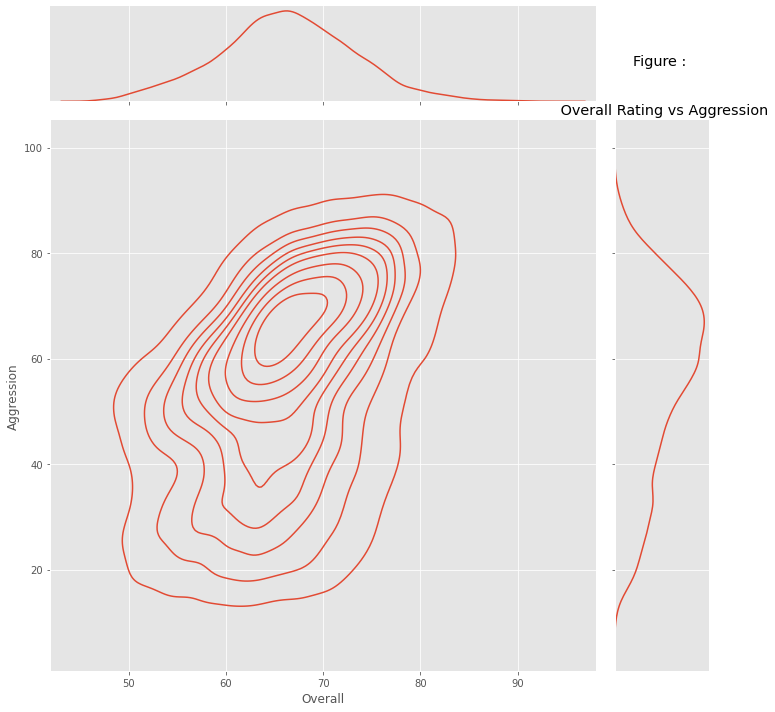

In [108]:
sns.jointplot(x="Overall", y="Aggression", palette="colorblind", data=df, kind="kde", height=10);
plt.title("Figure : \n\n\n Overall Rating vs Aggression",);

Text(0.5, 1.0, 'Figure:\n\n Overall vs Aggresion')

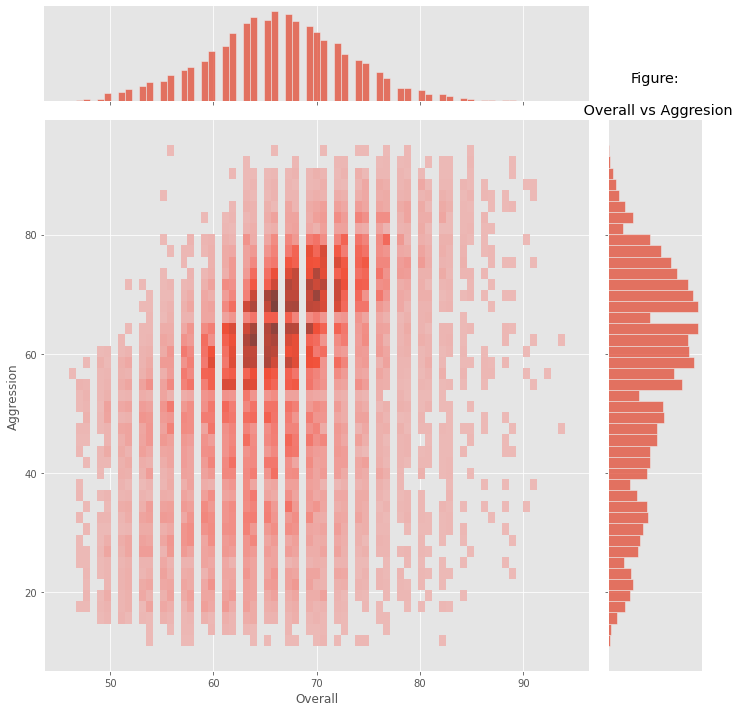

In [109]:
sns.jointplot(x="Overall", y="Aggression", palette="colorblind", kind="hist", data=df, height=10)
plt.title("Figure:\n\n Overall vs Aggresion")


Text(0.5, 1.0, 'Figure:\n\nOverall vs Aggression')

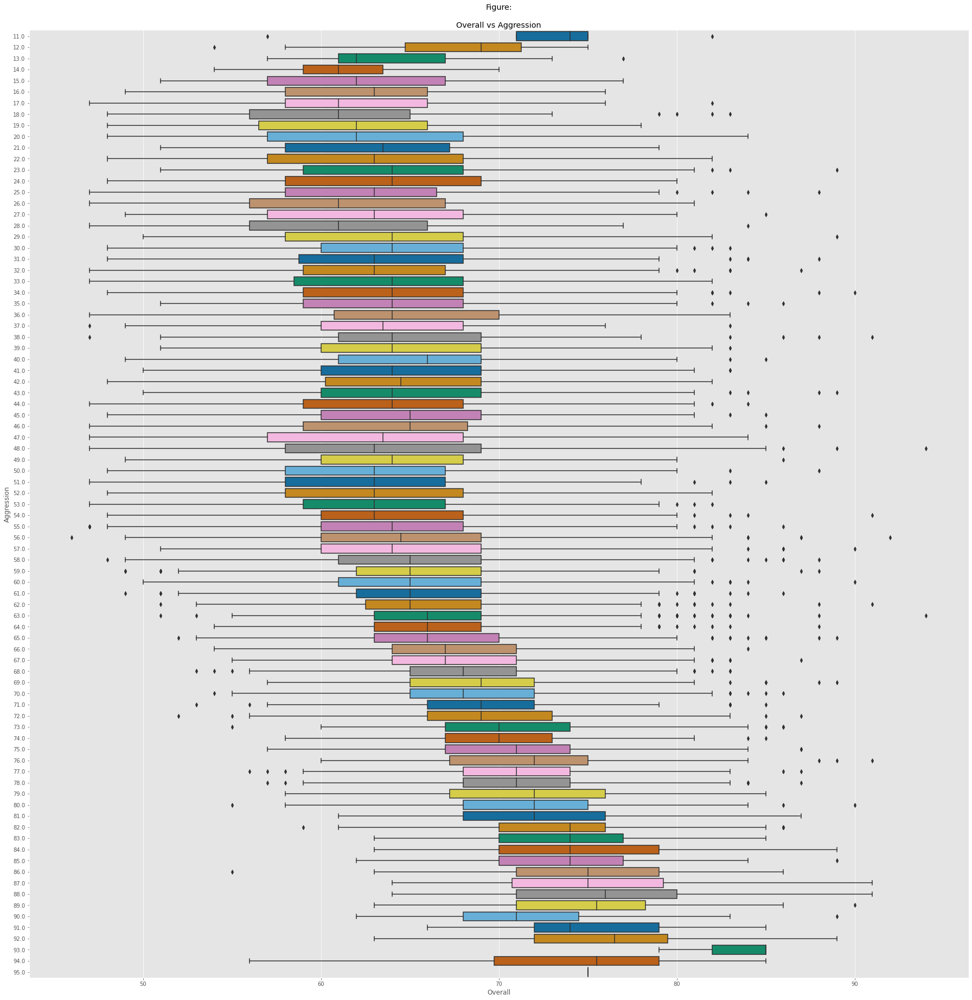

In [110]:
sns.catplot(x= "Overall", y= "Aggression", kind="box", orient="h", palette="colorblind", height=25, data=df)
plt.title("Figure:\n\nOverall vs Aggression")

In [111]:
df.Height.value_counts()


6'0     2881
5'10    2479
5'9     2238
5'11    2159
6'2     2015
6'1     1908
6'3      990
5'8      946
5'7      905
6'4      749
5'6      316
6'5      246
5'5      145
6'6       93
5'4       30
6'7       21
5'3       18
6'8       10
5'2        5
5'1        3
6'9        2
Name: Height, dtype: int64

In [112]:
df.Height.unique()

array(["5'7", "6'2", "5'9", "6'4", "5'11", "5'8", "6'0", "5'6", "5'10",
       "6'6", "6'1", "5'4", "6'3", "5'5", "6'5", "6'7", "5'3", "5'2",
       "6'8", "5'1", "6'9", nan], dtype=object)

In [113]:
avgwageoverall = df.groupby("Height", as_index=False)["Wage", "Overall"].mean()
avgwageoverall.sort_values(by="Wage", ascending= False, inplace=True)
avgwageoverall.head()



/var/folders/n7/mq8n_83j2wg08mtw7wxzjcyw0000gn/T/ipykernel_1365/2488794361.py:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  avgwageoverall = df.groupby("Height", as_index=False)["Wage", "Overall"].mean()


,Height,Wage,Overall
5,5'4,12.100000,67.400000
15,6'4,11.387183,66.951936
17,6'6,11.247312,66.709677
13,6'2,10.917122,67.018859
9,5'8,10.423890,66.344609


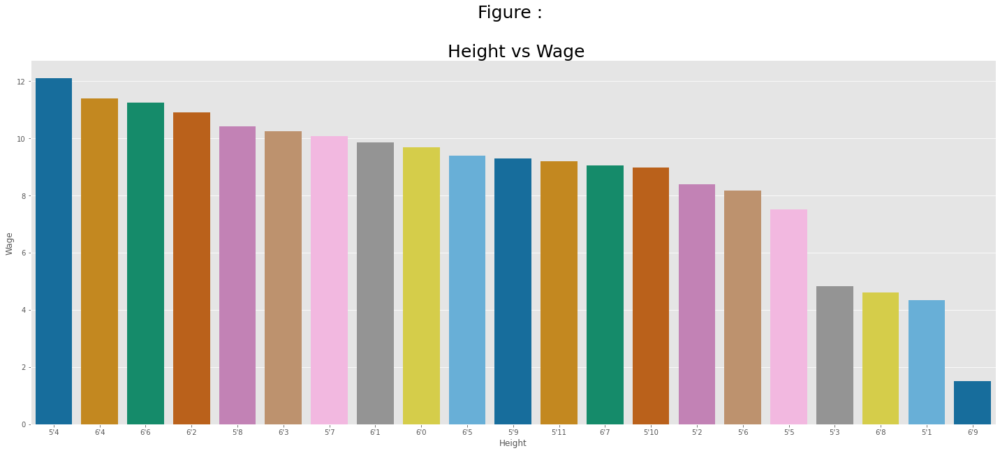

In [114]:
sns.catplot(x="Height", y="Wage",data=avgwageoverall,
            kind="bar",aspect=2.5 ,palette="colorblind", height= 8);
plt.title("Figure : \n\n Height vs Wage",fontsize=25);